# **Image Retrieval: Teach Computers to Search the Content**

<font color='red' face='Times New Roman'>*NOTE: Before running this code, please create a folder named ``Figures`` or any name you like in the root directory of your Google Drive.
Then, upload all the ``.jpg`` images to that folder.
Or you can directly save the following folder in your own Google Drive.*</font>

https://drive.google.com/drive/folders/1Itgf-w06JvsBcXidvP3uYVqsAVO3Lq_r?usp=sharing

In [1]:
# from google.colab import drive

# drive.mount('/content/drive')
# % pip install -U opencv-python
# % pip install -U opencv-contrib-python

Mounted at /content/drive
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.8/61.8 MB 10.0 MB/s eta 0:00:00
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.6.0.66
    Uninstalling opencv-python-4.6.0.66:
      Successfully uninstalled opencv-python-4.6.0.66
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.9/67.9 MB 12.8 MB/s eta 0:00:00
  Attempting uninstall: opencv-contrib-python
    Found existing installation: opencv-contrib-python 4.6.0.66
    Uninstalling opencv-contrib-python-4.6.0.66:
      Successfully uninstalled opencv-contrib-python-4.6.0.66


After Feature Extraction, images become "numbers" (vectors) in the feature space. This would be much esier for computers to deal with (than the original pixels). To use the content is to play with such "numbers". From this moment on, let's try to think all of these in the feature space. It gives you a more intuitive view of what's going on.



# **1. Image Clustering**

Recall the problem of teaching computers to draw "circles" which we left unsolved in the last lecture. The goal is to make groups as far as possible from each other while images in the same group as close as possible.

This can be done by clustersing. Clustering is a set of algorithms that groups feature vectors (in the feature space). The resulting groups are called clusters in which the inter-cluster distance is maximized while the inter-cluster distance is minimized.

Let's see how this can be done using K-Means.

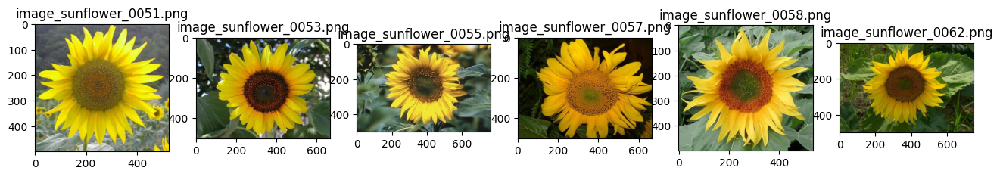

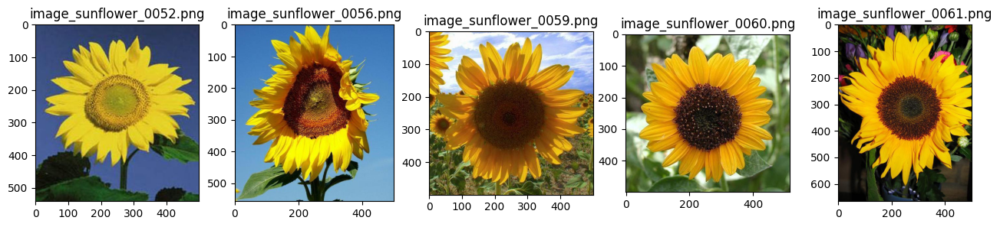

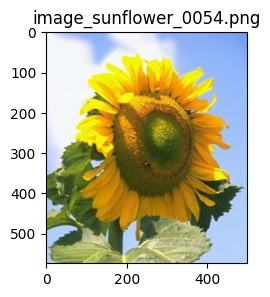

In [17]:
# pick some images from IMHere which can form 3-5 clusters
# use them as a demo dataset and run K-Means (you may need to try what's the best feature to use)
# show the results with images in the same cluster as a row (or colunm)

import os
import cv2
import numpy as np
from matplotlib import pyplot as plt
from skimage.feature import local_binary_pattern, hog

img_ext = ['.jpg', '.jpeg', '.png', '.tif', '.tiff', '.bmp']


def gray_histogram(img: np.array, norm: bool = True) -> np.array:
    """ Count the single-channel histogram
    
    Params:
        img:
            An image with size of H x W.
        norm:
            Whether normalize the sum of the histogram to 1.
    """
    hist = np.array([len(img[img == i]) for i in range(256)])
    if norm:
        return hist / np.size(img)
    return hist


def color_histogram(img: np.array, norm: bool = True) -> np.array:
    """ Count the multi-channel histogram
    
    Params:
        img:
            An image with size of H x W x C.
        norm:
            Whether normalize the sum of the histogram for each channel to 1.
    """
    return np.array([gray_histogram(img[..., i], norm=norm) for i in range(3)])


# configurations
# src = '/content/drive/MyDrive/Figures'
src = '/Users/hollyzhang/Documents/GitHub/COMP4423/T5_Figures'
img_nums = 12

imgs = {}
features = []
for i in range(img_nums):
    fname = "image_sunflower_00"+str(i + 51) +'.png'
    fpath = os.path.join(src, fname)

    # Display image
    img = cv2.imread(fpath, cv2.IMREAD_COLOR)[..., ::-1]  # BGR channels
    imgs[fname] = img
    if i != 0:
        h, w = imgs['image_sunflower_0051.png'].shape[0:2]
        img = cv2.resize(img, (w, h))

    # TODO: get feature vector for each image
    feature = hog(img, pixels_per_cell=(16, 16), cells_per_block=(1, 1), channel_axis=2) # hog == Histogram of Oriented Gradients
    features.append(feature.flatten())

# TODO: use cv2.kemeans to cluter the images
compactness, labels, centers = cv2.kmeans(np.array(features, dtype=np.float32), 3, None, (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2), 10, cv2.KMEANS_RANDOM_CENTERS)

results = {}
# get the cluter list
for i, l in enumerate(labels.flatten()):
    if l not in results.keys():
        results[l] = []
    results[l].append(i)

# display all cluters
for k in results.keys():
    num = len(results[k])
    plt.figure(figsize=(16, 3))
    for r in range(num):
        fname = "image_sunflower_00"+str(results[k][r] + 51) + '.png'

        plt.subplot(1, num, r + 1)
        plt.title(fname)
        img = imgs[fname]
        plt.imshow(img)


See? Now computers know how to play with image content. But the result is feature dependent. You may need to run a set of experiments to figure out what's the best. Feel free to modify the code to try them out.

Besides, as mentioned, it's pretty important to think in the feature space. We can visualize this using t-SNE, which a powerful tool to help us "see" what's happening inside the feature space.

In [18]:
# draw the results using t-SNE, we can show the results using different features
from sklearn.manifold import TSNE
import seaborn as sns

sns.set(rc={'figure.figsize': (11.7, 8.27)})
palette = sns.color_palette("bright", 4)

tsne = TSNE()
X_embedded = tsne.fit_transform(features)
print(X_embedded.shape)
sns.scatterplot(X_embedded[:, 0], X_embedded[:, 1], hue=labels.flatten(), legend='full', palette=palette)

AttributeError: 'list' object has no attribute 'shape'



# **2. Content-based Image Retrieval** 

With the feature space, the image retrieval is straightforward. Starting from any feature vector (point) in the space as a query, we can calculate its distances/similarities to other vectors (points, namely the targets) and sort the results as a ranked list. This is content-based image retriveal.

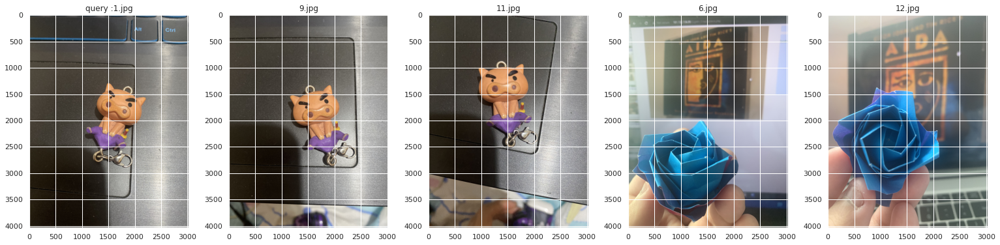

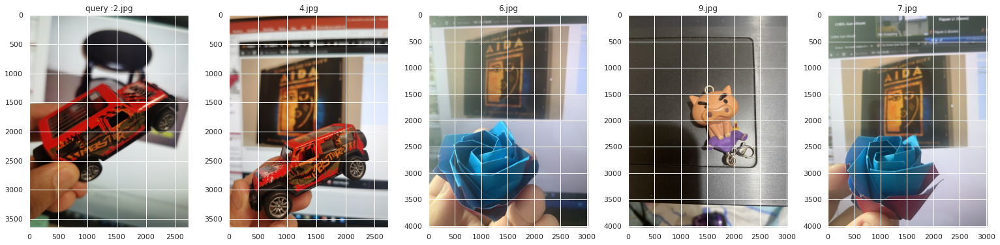

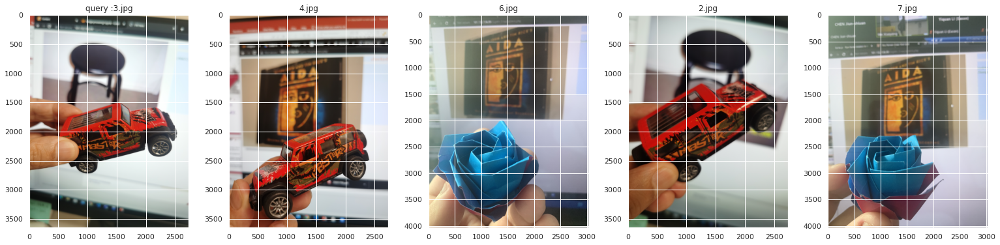

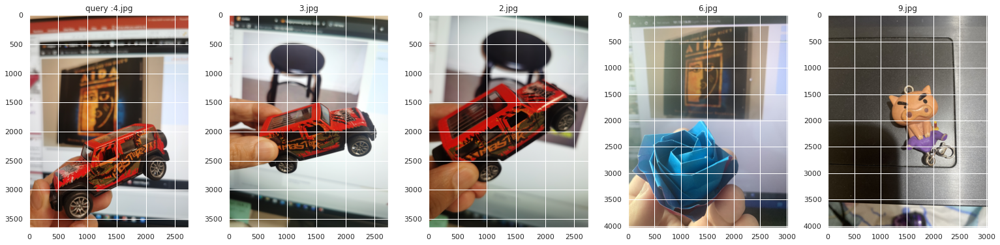

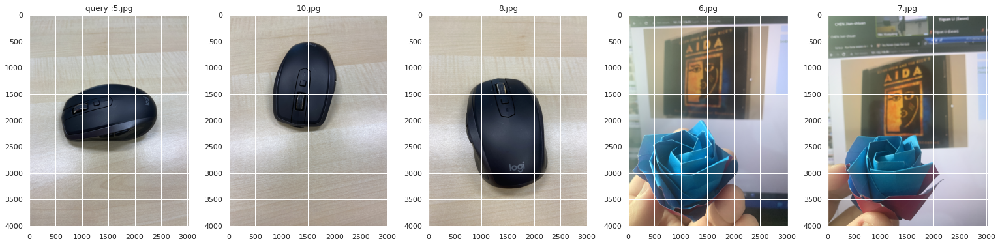

...

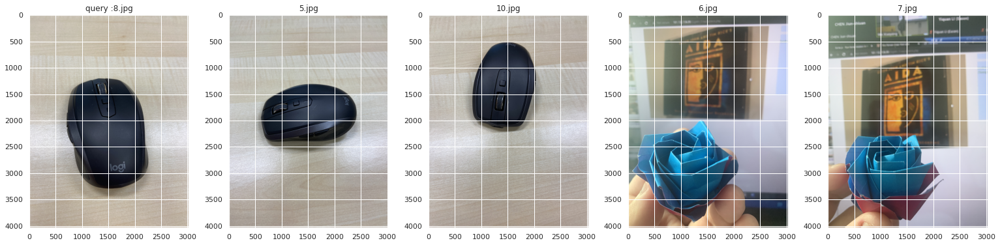

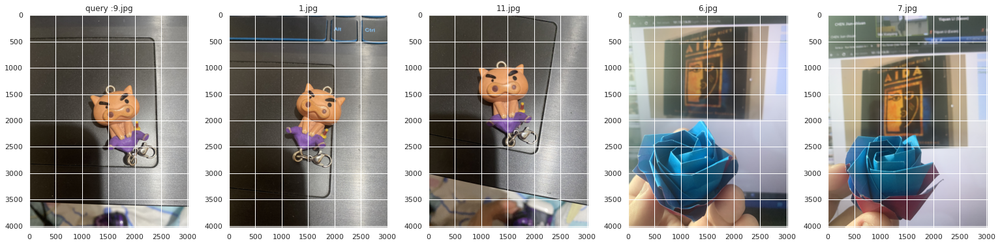

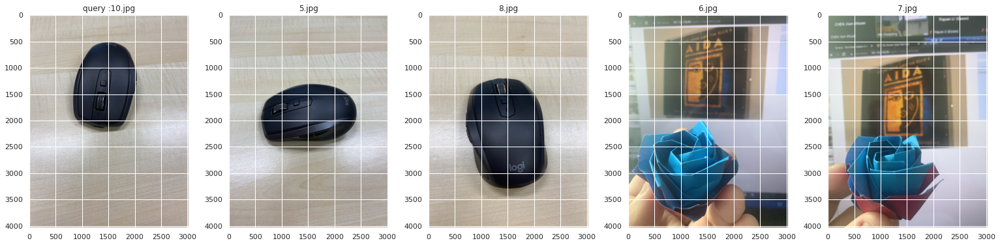

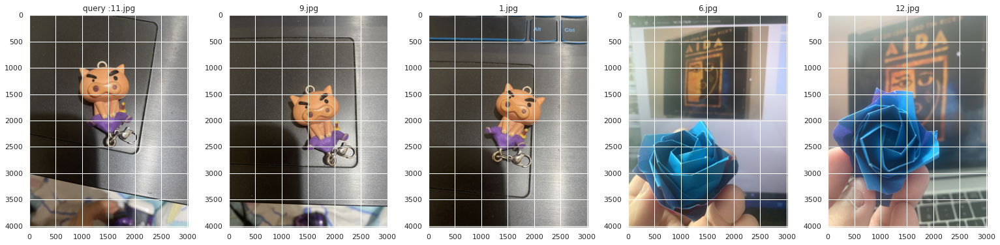

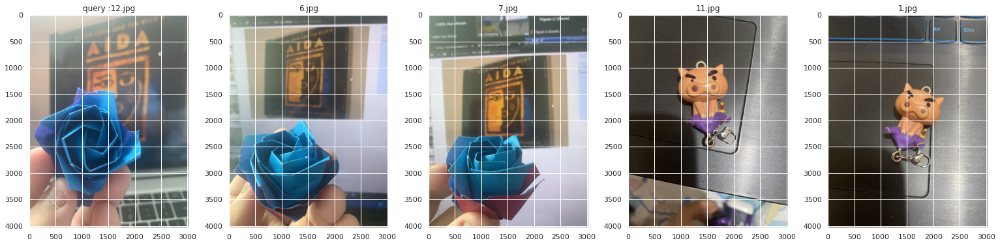

In [ ]:
# pick several images from IMHere as queries
# show the results of the ranked list for each query with similariteis/distances shown below targets as well
# put one query with its ranked list as a row. This gives several rows of images

# configurations
# src = '/content/drive/MyDrive/Figures'
img_nums = 12

imgs = {}
features = []
for i in range(img_nums):
    fname = str(i + 1) + '.jpg'
    fpath = os.path.join(src, fname)

    # Display image
    img = cv2.imread(fpath, cv2.IMREAD_COLOR)[..., ::-1]  # BGR channels
    imgs[fname] = img
    if i != 0:
        h, w = imgs['1.jpg'].shape[0:2]
        img = cv2.resize(img, (w, h))

    # TODO: get feature vector for each image
    feature = hog(img, pixels_per_cell=(16, 16), cells_per_block=(1, 1), multichannel=True) # hog == Histogram of Oriented Gradients
    features.append(feature.flatten())

for i, f in enumerate(features):
    # TODO: Calculate the distance between images
    dists = 

    # TODO: Rank the distance and get the first 4 most closest image
    ids = ?

    plt.figure(figsize=(32, 6))

    plt.subplot(1, 6, 1)
    fname = str(i + 1) + '.jpg'
    plt.title("query :" + fname)
    img = imgs[fname]
    plt.imshow(img)
    for i_id, id in enumerate(ids):
        fname = str(id + 1) + '.jpg'

        plt.subplot(1, 6, i_id + 2)
        plt.title(fname)
        img = imgs[fname]
        plt.imshow(img)




Feel free to try different features. 

This is basically what the image search engines are doing. But they do indexing to speed up the search. We will skip this because of time limitation.

# **3. Bag of Visual Words**

So far, we are using one feature vecctor for each image. However, in many applicaitons, there are multiple feature vectors for each image. The local features (e.g., SIFT) we introduced in the last lecture fall into this group. How can we conduct search on such features?

We can do it using Bag-of-Visual-Words (BoVW). The idea is to model each image as a "bag" with visual words (representative descriptors) inside. By counting the frequency of the visual words, we can have a histogram as the feature vector.

Let's do this step by step.

Step 1: Exract Local Discriptors

In [ ]:
# Extract SIFT features for all images in IMHere

from scipy.cluster.vq import *
from sklearn import preprocessing

src = '/content/drive/MyDrive/Figures'
img_nums = 12

imgs = {}
des_list = []
sift = cv2.SIFT_create()
for i in range(img_nums):
    fname = str(i + 1) + '.jpg'
    fpath = os.path.join(src, fname)

    # Display image
    img = cv2.imread(fpath, cv2.IMREAD_COLOR)[..., ::-1]  # BGR channels
    imgs[fname] = img
    if i != 0:
        h, w = imgs['1.jpg'].shape[0:2]
        img = cv2.resize(img, (w, h))

    # Display gray image
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # TODO: get SIFT descriptors
    kpt, des = ?

    des_list.append((fname, des))


Step 2: Pool all descriptors together, conduct the clustering, and build a dictionary

In [ ]:
# do the clustering
# consturct the dictionary

numWords = 1000

# TODO: Stack all the descriptors vertically in a numpy array
descriptors = des_list[0][1]
for image_path, descriptor in des_list[1:]:
    descriptors = ?

# TODO: Perform k-means clustering (using scipy.cluster.vq.kmeans)
print("Start k-means: %d words, %d key points" % (numWords, descriptors.shape[0]))
voc, variance = ?


Start k-means: 1000 words, 171724 key points


Step 3: Counting the words in each bag (image) to build the histogrames

In [ ]:
# build histograms
im_features = np.zeros((len(imgs), numWords), "float32")
for i in range(len(imgs)):
    # TODO: using scipy.cluster.vq
    words, distance = ?
    for w in words:
        im_features[i][w] += 1
# perform L2 normalization
im_features = preprocessing.normalize(im_features, norm='l2')

Now we are ready to search with BoVW. Do you see the difference of the results from what we had?

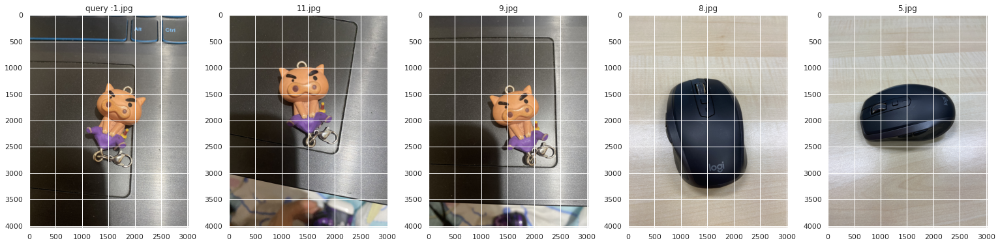

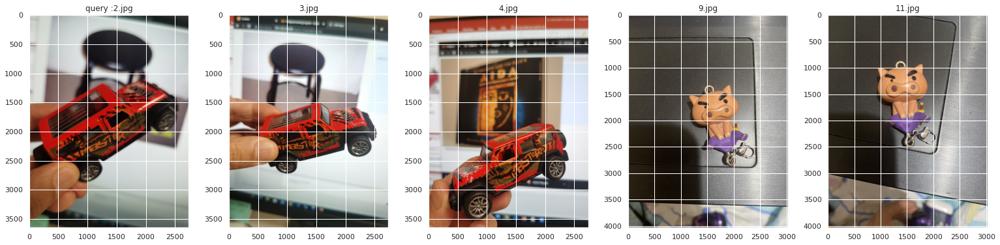

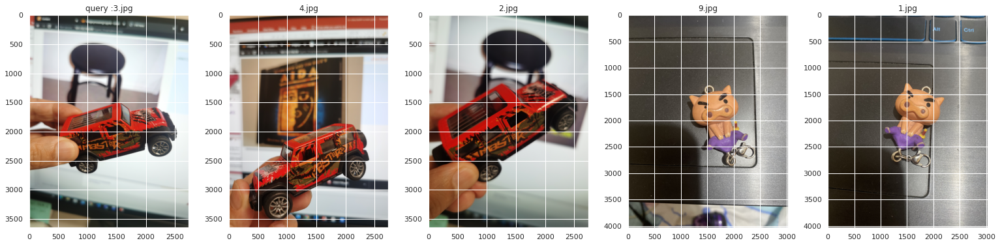

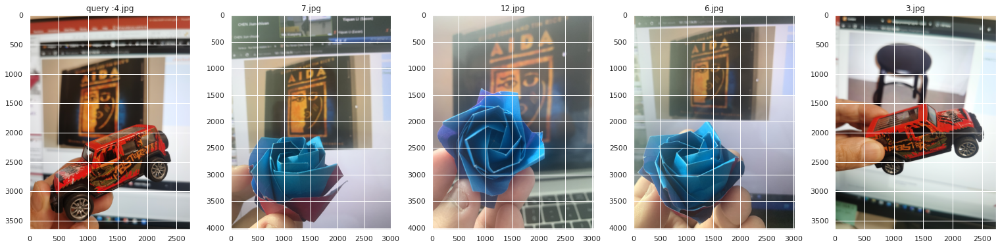

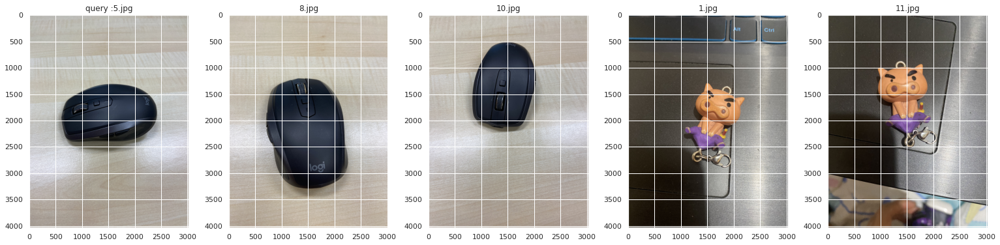

...

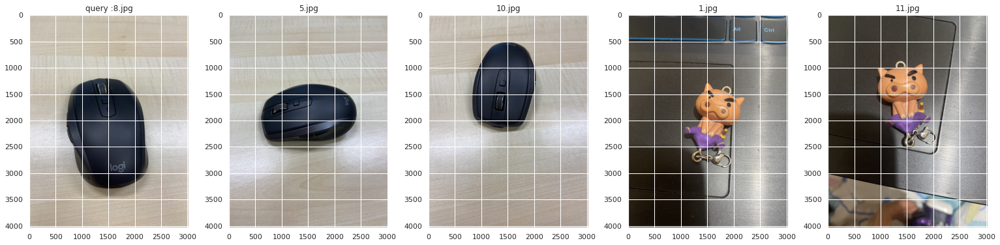

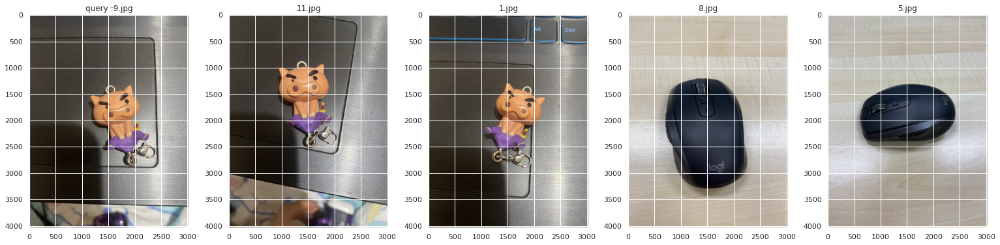

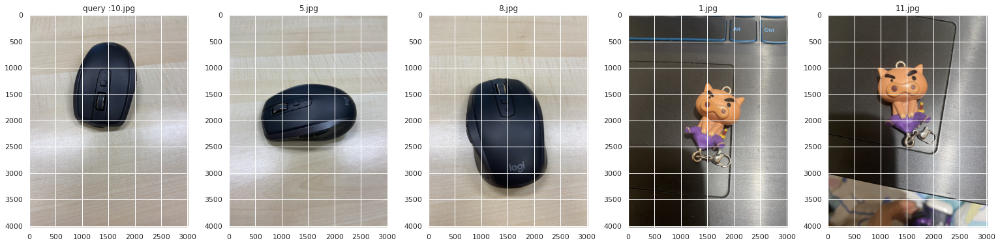

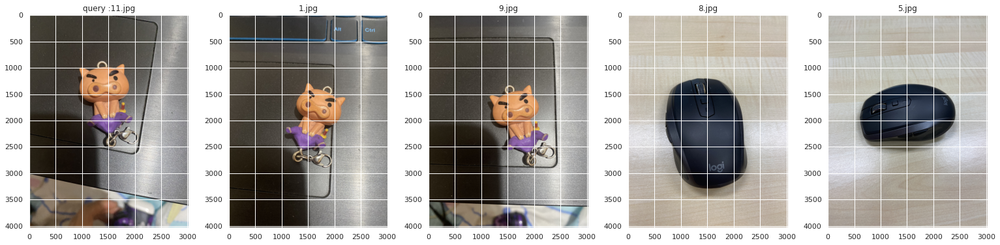

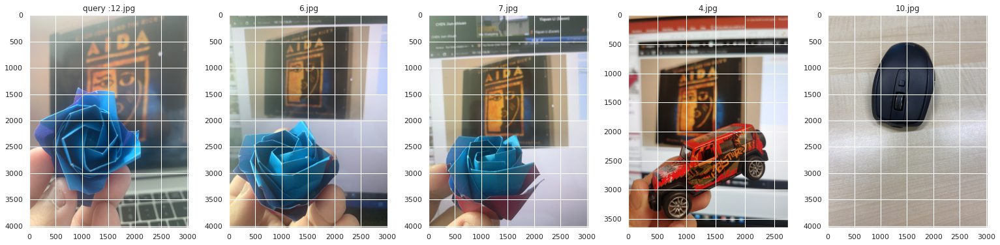

In [ ]:
# search with the features and draw the results

# TODO: get score matrix for all searched images
score = ?
# TODO: get ranked list
rank_ID = ?

for i, ids in enumerate(rank_ID):
    ids = ids[1:5]

    plt.figure(figsize=(32, 6))

    plt.subplot(1, 6, 1)
    fname = str(i + 1) + '.jpg'
    plt.title("query :" + fname)
    img = imgs[fname]
    plt.imshow(img)

    for i_id, id in enumerate(ids):
        fname = str(id + 1) + '.jpg'

        plt.subplot(1, 6, i_id + 2)
        plt.title(fname)
        img = imgs[fname]
        plt.imshow(img)

# **4. Challenges** 

We provide two options for you to complete the challenges:



## 1.   Tone Modifer

Implement the Tone Modifier we introduced in Lecture 5. The goal is to verify whether a BoVW works by finding for each frame its nearest neighbours in the feature space. You may start by picking keyframes and assigning for each of them a color tone. Then build a searcher which finds for each non-keyframes the top-2 nearest keyframe neighbours, and modify the tone of the frame using a weighted average of the tones of the keyframes retrieved. The final modifed videos should with a smooth transition of color tone if BoVW works.

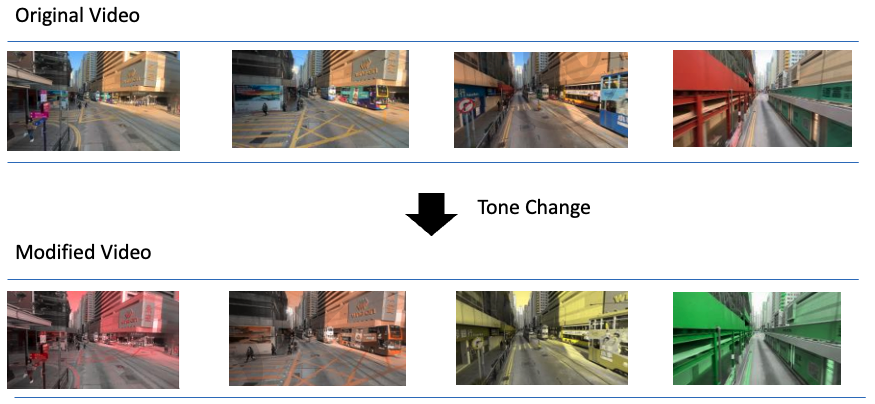

## 2.   Video Recovery
Given frames from a video sampled with a random order, resort the orgial order of these frames in the video. Tips: frame at time t usually has the greatest similarities with its neighbour frames at t-1 and t+1. 

You can download the frames in random order via this link:

https://drive.google.com/drive/folders/1r7FRB2QRwBd-McdYaQxOamuxFomTPYRO?usp=sharing


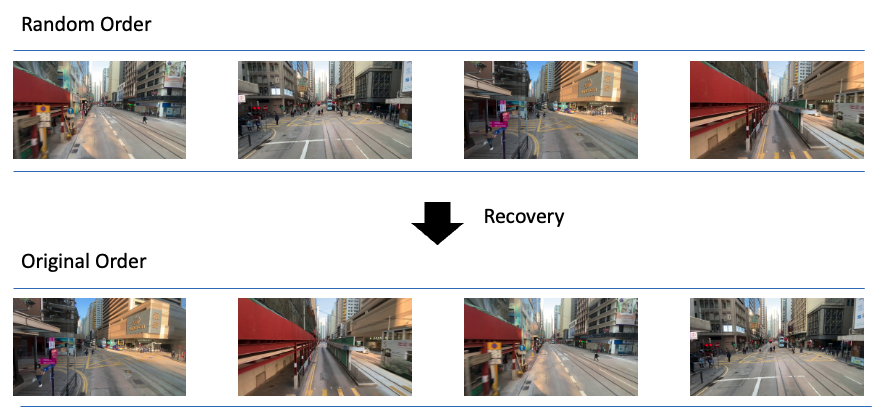
